In [1]:
import pandas as pd 
import numpy as np 
import gc
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns 

# Import data, setting dtype to save memory

In [2]:
levels_keep_cols = ['TankId', 'TankLevelPercent', 'TankLevelGallons', 'ExactFuelEventId']
levels_col_types = {'TankId': 'category',
             'ExactFuelEventId': 'uint64',
             'TankLevelPercent': 'float32',
             'TankLevelGallons': 'float32'}
#Rows with TankId == '2' are dropped on read-in, after being manually identified
levels_fueltank_df = pd.read_csv('data/Extranet2.ExactFuelTankLevels.csv', 
                                 skiprows=[48671, 1824800, 4579415, 5656381],
                                 usecols = levels_keep_cols, 
                                 dtype=levels_col_types ).drop(
    ['TankId'], axis=1)

#levels_fueltank_df = levels_fueltank_df.set_index('ExactFuelEventId').drop(['TankId'], axis=1)

#### Fuel Optimization data; only need tank capacity

In [3]:
optimization_fuel_df = pd.read_csv('data/BGEIDSC.EF2EFFP.csv',
                                   dtype={'TANKCAP': 'uint16', 'TRUCK' : 'uint32'},
                                  usecols = ['TRUCK', 'TANKCAP'])
optimization_fuel_df.columns = [s.lower() for s in optimization_fuel_df.columns]

In [4]:
def trim_categories(df, cols_list):
    for col in cols_list:
        df[col].cat.rename_categories(df[col].cat.categories.str.strip(), inplace=True)

In [5]:
units_df = pd.read_csv('data/IBGEFILE.UNITS.csv', 
                       dtype = {'UNMAKE': 'category'})
#Can drop non-int units
units_df.columns = ['unit_number', 'model_year', 'make'] 

# Trim white space from category strings 

# Remove invalid entries
units_df.unit_number = pd.to_numeric(units_df.unit_number, errors = 'coerce')
units_df = units_df[units_df.unit_number != 1].dropna()
#units_df = units_df[units_df.unit_number.isin(['ZEBE', 'CCTRK', 'BGXL', '1']) == False]
#set index

trim_categories(units_df, ['make'])
# Fix typos
units_df.make[units_df.make.isin(['KENOWRTH', 'KEWORTH'])] = 'KENWORTH'



In [6]:
transaction_df_cols = ['tr_id', 'tr_date', 'tr_time', 'tr_station_id', 'tr_station_name',
                         'tr_station_cty', 'tr_station_st', 'tr_drvr_code', 'tr_unit_id', 
                         'tr_item_cd1', 'tr_item_qty1', 'tr_item_cd2', 'tr_item_qty2',
                          'tr_item_cd3', 'tr_item_qty3', 'tr_item_cd4', 'tr_item_qty4',
                          'tr_item_cd5', 'tr_item_qty5', 'tr_item_cd6', 'tr_item_qty6']
tr_dtypes= {'tr_id' : 'uint32',  
            'tr_date' : 'uint32', 
            'tr_time' : 'uint32', 
            'tr_station_name' : 'object', 
            'tr_station_cty' : 'object', 
            'tr_station_st' : 'object', 
            'tr_drvr_code' : 'category', 
            'tr_unit_id' : 'category', 
            'tr_item_cd1' : 'category', 
            'tr_item_qty1' : 'float32', 
            'tr_item_cd2' : 'category', 
            'tr_item_qty2' : 'float32', 
            'tr_item_cd3' : 'category', 
            'tr_item_qty3' : 'float32', 
            'tr_item_cd4' : 'category', 
            'tr_item_qty4' : 'float32', 
            'tr_item_cd5' : 'category', 
            'tr_item_qty5' : 'float32', 
            'tr_item_cd6' : 'category', 
            'tr_item_qty6' : 'float32'}
act_fuel_transactions = ['ULSD', 'FUEL', 'CDSL', 'DSL1', 'BDSL']
transaction_df = pd.read_csv('data/BGETCHDATA.PTCHTRANH.csv', names = transaction_df_cols, dtype = tr_dtypes, header=0 )

# Trim white space from category strings 
trim_categories(transaction_df, ['tr_drvr_code','tr_unit_id','tr_item_cd1', 'tr_item_cd2', 'tr_item_cd3', 'tr_item_cd4', 'tr_item_cd5', 'tr_item_cd6' ])

#### Create datetime column in transactions_df

In [7]:
#confirm no junk data in this col (returns false if no NaNs)
None in transaction_df.tr_time

# 20170112 3

#Combine tr_date and tr_time into a single date time column
    #1. zero pad tr_time on left for interpretation as military time
        #cast tr_time as string
transaction_df.tr_time = transaction_df.tr_time.astype(str)

# 20170112 '3' Time column is now a string
#ensure none of my strings are over 4 digits in length
for s in transaction_df.tr_time:
    assert len(s) < 5

#check for blanks
'' in transaction_df.tr_time

#add zeros to the left until each cell is len 4
zero_padded_time = []
for s in transaction_df.tr_time:
    while len(s) < 4:
        s = '0' + s
    zero_padded_time.append(s)
# 20170112 '0003' zero padded minutes
#spot check
for s in zero_padded_time:
    assert len(s) == 4

transaction_df.tr_time = zero_padded_time

#append tr_date (as string) and tr_time together, and then convert them to dateime
#transaction_df.tr_datetime 
tst = [datetime.strptime(str(d) + 
                         t, '%Y%m%d%H%M') 
       for d, t in zip(transaction_df.tr_date,
                       transaction_df.tr_time)]
#love list comprehensions

transaction_df['tr_datetime'] = tst#assign

#drop superfluous columns
transaction_df.drop(['tr_date','tr_time'], axis = 'columns', inplace=True)
transaction_df.head()

,tr_id,tr_station_id,tr_station_name,tr_station_cty,tr_station_st,tr_drvr_code,tr_unit_id,tr_item_cd1,tr_item_qty1,tr_item_cd2,tr_item_qty2,tr_item_cd3,tr_item_qty3,tr_item_cd4,tr_item_qty4,tr_item_cd5,tr_item_qty5,tr_item_cd6,tr_item_qty6,tr_datetime
0,42574765,520277,FLYING J VANDALIA 97,VANDALIA,OH,ULAL,1564,SCLE,1.000000,,0.00,,0.0,,0.0,,0.0,,0.0,2017-01-01 00:20:00
1,42575331,516202,PILOT NEW BRAUNFELS 330,NEW BRAUNFELS,TX,MANRI,1584,ULSD,137.399994,DEFD,7.71,CADV,1.0,,0.0,,0.0,,0.0,2017-01-01 00:48:00
2,42578678,516277,PILOT 421,DALTON,GA,RUSR,1713,ULSD,137.929993,DEFD,4.12,,0.0,,0.0,,0.0,,0.0,2017-01-01 01:34:00
3,42578722,231100,FJ-BRUNSWICK 627,BRUNSWICK,GA,FOSJA,1711,ULSD,45.000000,,0.00,,0.0,,0.0,,0.0,,0.0,2017-01-01 01:37:00
4,42579695,523050,BIG G EXPRESS TERMINAL,GLADEVILLE,TN,HICWIL,1837,ULSD,107.360001,,0.00,,0.0,,0.0,,0.0,,0.0,2017-01-01 03:02:00


In [8]:
events_keep_cols = ['Id', 'EventTimeStamp', 'EquipmentID', 
                    'DriverID', 'Latitude', 'Longitude', 'LocationTimeStamp', 
                    'Speed', 'Odometer', 'IgnitionStatus', 'EFReportReason']
events_col_types = {'DriverID': 'category',
             'EFReportReason': 'category',
             'EquipmentID': 'uint32',
             'Id': 'uint64',
             'IgnitionStatus': 'category',
             'Latitude': 'float64',
             'Longitude': 'float64',
             'Odometer': 'float64',
             'Speed': 'uint16'}

events_levels_df = pd.read_csv('data/Extranet2.ExactFuelEvents.csv', 
                             usecols=events_keep_cols, 
                            dtype=events_col_types, 
                             parse_dates=['EventTimeStamp', 'LocationTimeStamp'], 
                            infer_datetime_format=True).merge(
    levels_fueltank_df, copy=False, how='inner', left_on='Id', right_on='ExactFuelEventId').merge(
    optimization_fuel_df, copy=False, how='left', left_on='EquipmentID', right_on = 'truck')
trim_categories(events_levels_df, ['DriverID','EFReportReason', 'IgnitionStatus' ])

## Sort by truck and EventTimeStamp and reset index

In [9]:
events_levels_df.sort_values(['truck', 'EventTimeStamp'], inplace = True)
events_levels_df.reset_index(inplace = True, drop = True)

# Inspect Data

In [10]:
events_levels_df

,Id,EventTimeStamp,EquipmentID,DriverID,Latitude,Longitude,LocationTimeStamp,Speed,Odometer,IgnitionStatus,EFReportReason,TankLevelPercent,TankLevelGallons,ExactFuelEventId,truck,tankcap
0,20141602,2018-01-31 15:31:18.940,301,DELST,36.06673,-86.43488,2018-01-31 15:31:21,0,342355.5,2,1,71.400002,142.800003,20141602,301,200
1,20160137,2018-02-01 11:52:11.140,301,DELST,36.37535,-86.42045,2018-02-01 11:52:10,0,342355.5,2,1,61.200001,122.400002,20160137,301,200
2,20160134,2018-02-01 11:53:41.140,301,DELST,36.37535,-86.42045,2018-02-01 11:53:40,0,342355.5,2,0,61.200001,122.400002,20160134,301,200
3,20160136,2018-02-01 11:56:51.140,301,DELST,36.37535,-86.42045,2018-02-01 11:56:50,0,342521.1,2,1,61.299999,122.599998,20160136,301,200
4,20160188,2018-02-01 11:58:41.157,301,DELST,36.37535,-86.42045,2018-02-01 11:58:40,0,342521.1,2,0,61.299999,122.599998,20160188,301,200
5,20160663,2018-02-01 12:16:47.933,301,DELST,36.37533,-86.42041,2018-02-01 12:16:50,0,342521.1,1,0,62.500000,125.000000,20160663,301,200
6,20161001,2018-02-01 12:31:48.060,301,DELST,36.34041,-86.43724,2018-02-01 12:31:50,54,342524.4,1,2,59.700001,119.400002,20161001,301,200
7,20161357,2018-02-01 12:46:58.060,301,DELST,36.18599,-86.40793,2018-02-01 12:47:00,0,342535.3,1,2,52.299999,104.599998,20161357,301,200
8,20161731,2018-02-01 13:01:58.060,301,DELST,35.98844,-86.43675,2018-02-01 13:02:00,67,342549.5,1,2,49.400002,98.800003,20161731,301,200
9,20162643,2018-02-01 13:40:18.433,301,DELST,35.74282,-86.94077,2018-02-01 13:40:21,4,342590.2,1,2,47.099998,94.199997,20162643,301,200


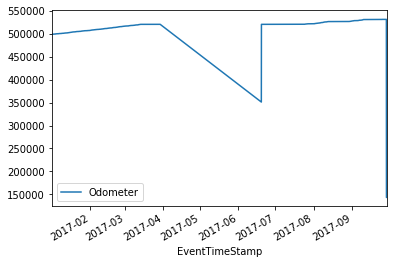

In [11]:
##ploting one single trucks odometer time series

events_levels_df[events_levels_df.truck == 1564].plot(x = 'EventTimeStamp', y = 'Odometer')
plt.show()

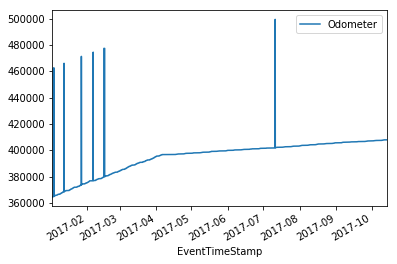

In [12]:
events_levels_df[events_levels_df.truck == 1563].plot(x = 'EventTimeStamp', y = 'Odometer')
plt.show()

In [13]:
events_levels_df.truck.unique()

array([ 301,  302,  303,  304,  305,  306,  307,  308,  309,  310, 1508,
       1513, 1516, 1519, 1520, 1521, 1524, 1525, 1526, 1527, 1528, 1529,
       1530, 1531, 1534, 1535, 1537, 1539, 1543, 1547, 1548, 1549, 1550,
       1551, 1552, 1554, 1555, 1556, 1557, 1558, 1559, 1560, 1561, 1562,
       1563, 1564, 1565, 1566, 1567, 1568, 1569, 1570, 1571, 1572, 1573,
       1574, 1575, 1576, 1577, 1578, 1579, 1580, 1581, 1582, 1583, 1584,
       1585, 1586, 1587, 1588, 1589, 1590, 1591, 1592, 1593, 1594, 1595,
       1596, 1597, 1598, 1599, 1600, 1601, 1602, 1603, 1604, 1607, 1608,
       1609, 1610, 1611, 1612, 1613, 1614, 1615, 1616, 1617, 1618, 1619,
       1620, 1621, 1622, 1623, 1624, 1625, 1626, 1627, 1628, 1629, 1630,
       1631, 1632, 1633, 1634, 1635, 1636, 1638, 1639, 1640, 1641, 1642,
       1643, 1644, 1645, 1647, 1648, 1649, 1650, 1651, 1652, 1653, 1654,
       1655, 1656, 1657, 1658, 1659, 1660, 1661, 1662, 1663, 1664, 1665,
       1666, 1667, 1668, 1669, 1670, 1671, 1672, 16

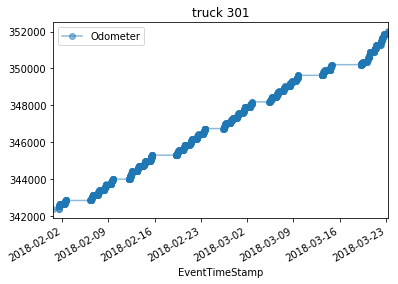

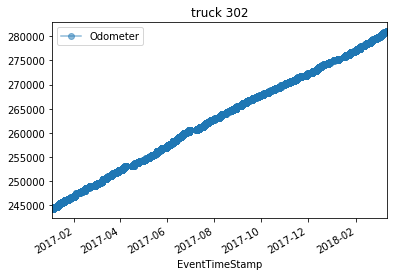

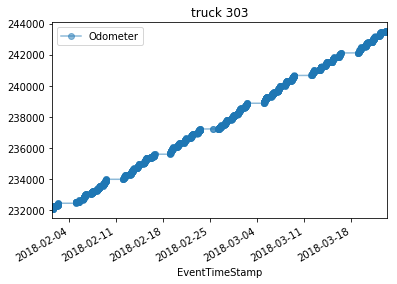

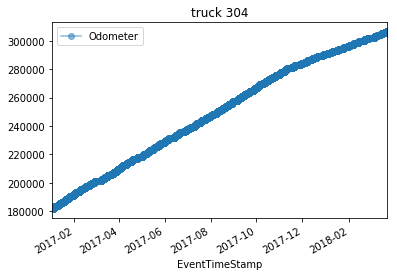

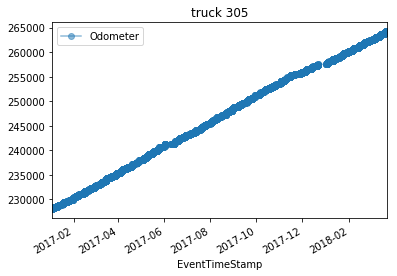

...

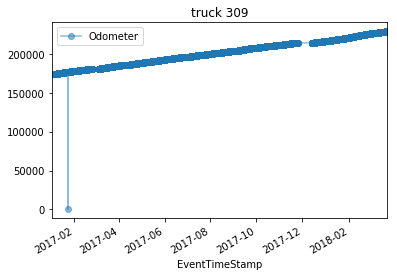

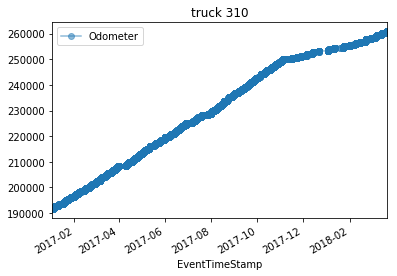

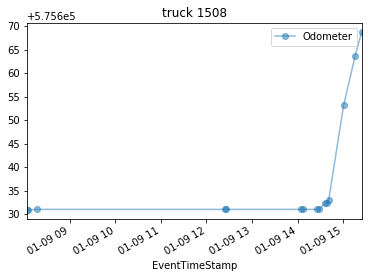

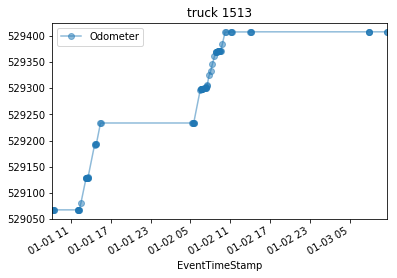

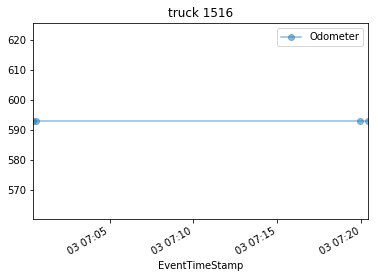

/Users/paulomartinez/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_base.py:2917: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=736332.61153, right=736332.61153
  'left=%s, right=%s') % (left, right))


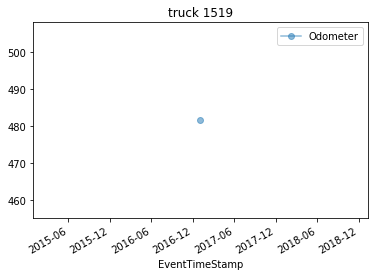

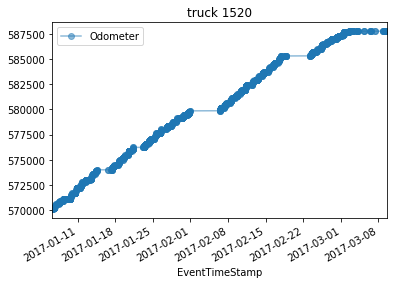

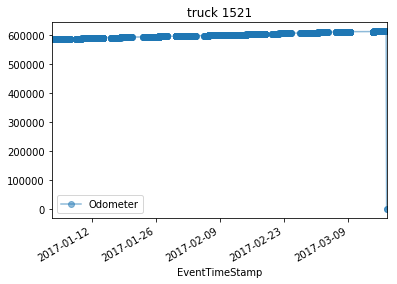

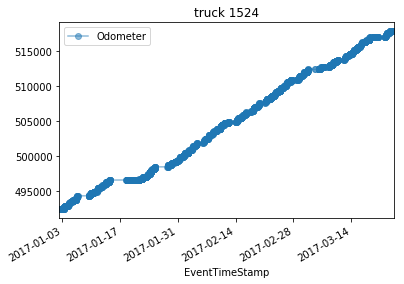

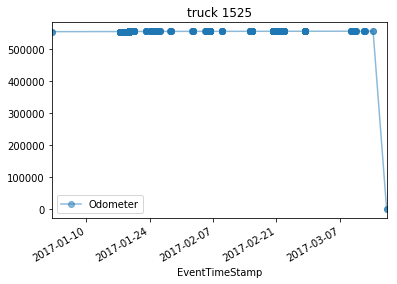

...

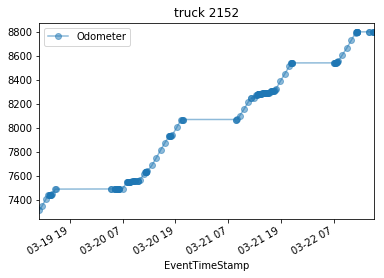

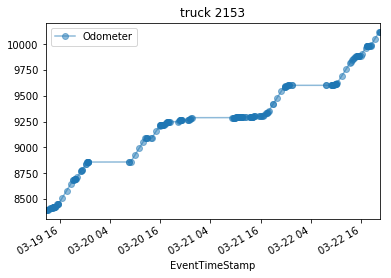

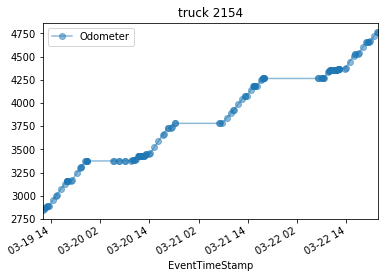

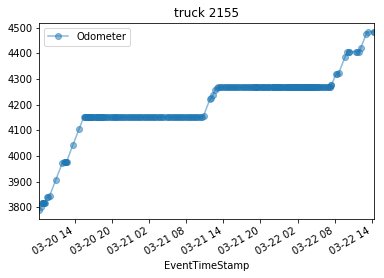

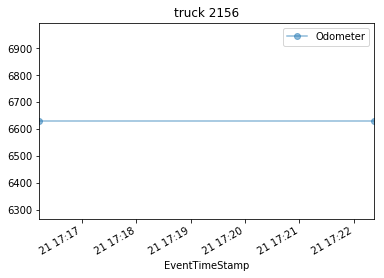

In [14]:
#this cell will generate 629 odometer plot series. One for every truck.
    #it takes about 5 minutes

for truck in events_levels_df.truck.unique():
    _ = events_levels_df[events_levels_df.truck == truck].plot(x = 'EventTimeStamp', y = 'Odometer', marker = 'o', alpha = 0.5, 
                                                               title = 'truck ' + str(truck))
    plt.show()

# troublesome_odometers = [2099, 1554, 1558, 1565, 1572, 1579, 1580, 1582, 1597, 1598, 1599, 1626, 1668, 1682, 1771, 1782, 1789, 1849, 1859, 1894, 1899, 1917, 1919, 1924, 1933, 1940, 2011]

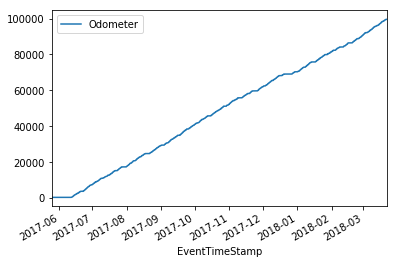

In [15]:
events_levels_df[events_levels_df.truck == 2063].plot(x = 'EventTimeStamp', y = 'Odometer', )
plt.show()

# function to flag noisy rows

In [16]:
# lets try to optimize the performance of the flagging function

def flag_anomal_odom_rows_2(df):#!!!! requires a dataframe with a reset index!!!!
    '''takes a dataframe with an Odometer column and returns a boolean index of 
    identifying which rows are noisy Odometer readings and should be dropped'''
    
    #initialize a series, without attaching it to the df in the hopes of expediency
    OdomDiff = df.Odometer.diff()
    
    #initialize list which will serve as a boolean index
    flags = []
    
    flag = 1 #this will be flipped like a switch 1 means do not drop, 0 means drop

    #loop through each difference measurement
    for i in range(len(OdomDiff) - 1):
    # the loop will flag all but the last row because otherwise I'd have to find a way to loop around the "corner" of the index
    #            
    #   #will start by flaggin with 1 (do not drop) until an anomaly flips it.
        flags.append(bool(flag))
    #    
    #   # for each truck, if odometer change is anomalous (i.e. spikes up or down) flip the flag switch
        if (df.truck[i + 1] == df.truck[i]) & (abs(OdomDiff[i + 1]) > 200): 
            flag = (flag + 1)%2
    #       #the flag will remain on the delete (i.e. 0) setting until the loop detects the spike that corrects the odometer
    #       
    #   # if we change trucks before the anomaly is corrected reset the flag to do not drop (i.e. 1)   
        if df.truck[i + 1] != df.truck[i]:
            flag = 1
    #        
    #now that the loop is done, we append the last flag (which is in the state the loop left it. So, if a loop ends before the anomaly is corrected, the flag will still be set at 0/False)
    flags.append(bool(flag))
    
    return flags

## Test drive function on toydf

In [17]:
toydf = events_levels_df[0:1000000]

In [18]:
toydf.sort_values(['truck', 'EventTimeStamp'], inplace = True)
toydf.reset_index(drop = True, inplace = True)

/Users/paulomartinez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [19]:
toydf

,Id,EventTimeStamp,EquipmentID,DriverID,Latitude,Longitude,LocationTimeStamp,Speed,Odometer,IgnitionStatus,EFReportReason,TankLevelPercent,TankLevelGallons,ExactFuelEventId,truck,tankcap
0,20141602,2018-01-31 15:31:18.940,301,DELST,36.06673,-86.43488,2018-01-31 15:31:21,0,342355.5,2,1,71.400002,142.800003,20141602,301,200
1,20160137,2018-02-01 11:52:11.140,301,DELST,36.37535,-86.42045,2018-02-01 11:52:10,0,342355.5,2,1,61.200001,122.400002,20160137,301,200
2,20160134,2018-02-01 11:53:41.140,301,DELST,36.37535,-86.42045,2018-02-01 11:53:40,0,342355.5,2,0,61.200001,122.400002,20160134,301,200
3,20160136,2018-02-01 11:56:51.140,301,DELST,36.37535,-86.42045,2018-02-01 11:56:50,0,342521.1,2,1,61.299999,122.599998,20160136,301,200
4,20160188,2018-02-01 11:58:41.157,301,DELST,36.37535,-86.42045,2018-02-01 11:58:40,0,342521.1,2,0,61.299999,122.599998,20160188,301,200
5,20160663,2018-02-01 12:16:47.933,301,DELST,36.37533,-86.42041,2018-02-01 12:16:50,0,342521.1,1,0,62.500000,125.000000,20160663,301,200
6,20161001,2018-02-01 12:31:48.060,301,DELST,36.34041,-86.43724,2018-02-01 12:31:50,54,342524.4,1,2,59.700001,119.400002,20161001,301,200
7,20161357,2018-02-01 12:46:58.060,301,DELST,36.18599,-86.40793,2018-02-01 12:47:00,0,342535.3,1,2,52.299999,104.599998,20161357,301,200
8,20161731,2018-02-01 13:01:58.060,301,DELST,35.98844,-86.43675,2018-02-01 13:02:00,67,342549.5,1,2,49.400002,98.800003,20161731,301,200
9,20162643,2018-02-01 13:40:18.433,301,DELST,35.74282,-86.94077,2018-02-01 13:40:21,4,342590.2,1,2,47.099998,94.199997,20162643,301,200


In [20]:
len(set(toydf.truck))

118

In [21]:
t0 = datetime.now()
print('started at', t0)
toyseries = flag_anomal_odom_rows_2(toydf[['Odometer', 'truck']])
tf = datetime.now()
print('finished at', tf, 'whole process took ', tf-t0)

started at 2018-05-05 11:55:15.373494
finished at 2018-05-05 11:57:15.762353 whole process took  0:02:00.388859


In [22]:
toyseries

[True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,

In [23]:
toydf

,Id,EventTimeStamp,EquipmentID,DriverID,Latitude,Longitude,LocationTimeStamp,Speed,Odometer,IgnitionStatus,EFReportReason,TankLevelPercent,TankLevelGallons,ExactFuelEventId,truck,tankcap
0,20141602,2018-01-31 15:31:18.940,301,DELST,36.06673,-86.43488,2018-01-31 15:31:21,0,342355.5,2,1,71.400002,142.800003,20141602,301,200
1,20160137,2018-02-01 11:52:11.140,301,DELST,36.37535,-86.42045,2018-02-01 11:52:10,0,342355.5,2,1,61.200001,122.400002,20160137,301,200
2,20160134,2018-02-01 11:53:41.140,301,DELST,36.37535,-86.42045,2018-02-01 11:53:40,0,342355.5,2,0,61.200001,122.400002,20160134,301,200
3,20160136,2018-02-01 11:56:51.140,301,DELST,36.37535,-86.42045,2018-02-01 11:56:50,0,342521.1,2,1,61.299999,122.599998,20160136,301,200
4,20160188,2018-02-01 11:58:41.157,301,DELST,36.37535,-86.42045,2018-02-01 11:58:40,0,342521.1,2,0,61.299999,122.599998,20160188,301,200
5,20160663,2018-02-01 12:16:47.933,301,DELST,36.37533,-86.42041,2018-02-01 12:16:50,0,342521.1,1,0,62.500000,125.000000,20160663,301,200
6,20161001,2018-02-01 12:31:48.060,301,DELST,36.34041,-86.43724,2018-02-01 12:31:50,54,342524.4,1,2,59.700001,119.400002,20161001,301,200
7,20161357,2018-02-01 12:46:58.060,301,DELST,36.18599,-86.40793,2018-02-01 12:47:00,0,342535.3,1,2,52.299999,104.599998,20161357,301,200
8,20161731,2018-02-01 13:01:58.060,301,DELST,35.98844,-86.43675,2018-02-01 13:02:00,67,342549.5,1,2,49.400002,98.800003,20161731,301,200
9,20162643,2018-02-01 13:40:18.433,301,DELST,35.74282,-86.94077,2018-02-01 13:40:21,4,342590.2,1,2,47.099998,94.199997,20162643,301,200


## inspect the result of flagging and filtering-out noisy rows with the function

/Users/paulomartinez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.


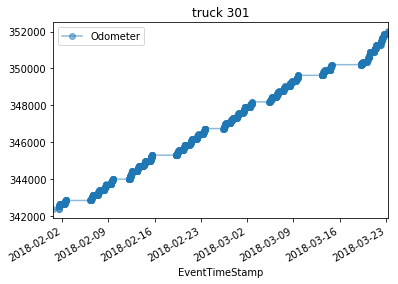

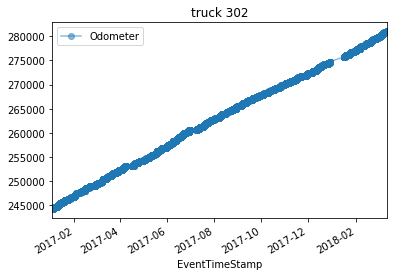

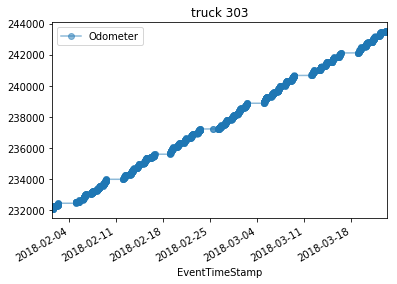

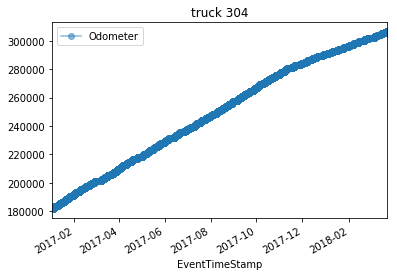

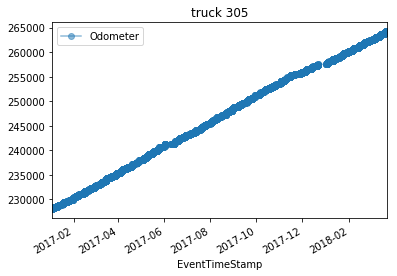

...

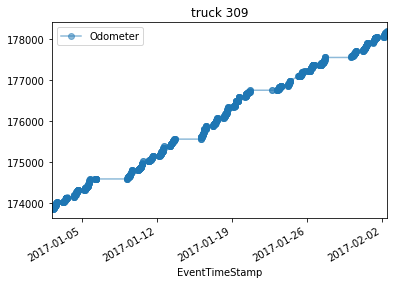

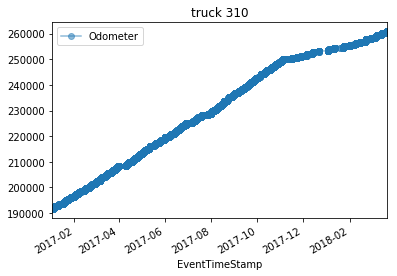

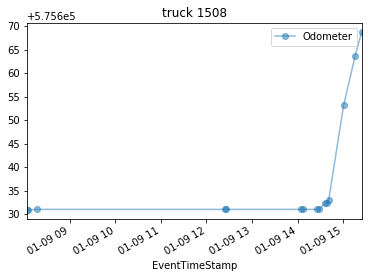

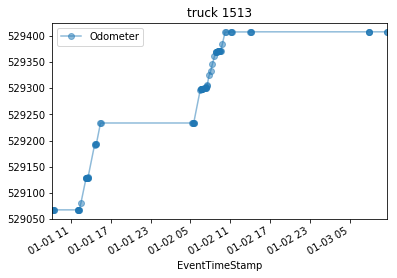

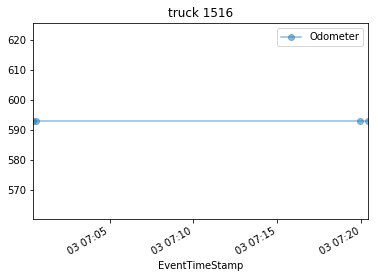

/Users/paulomartinez/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_base.py:2917: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=736332.61153, right=736332.61153
  'left=%s, right=%s') % (left, right))


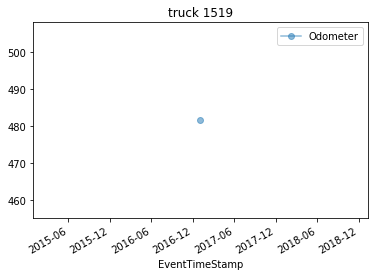

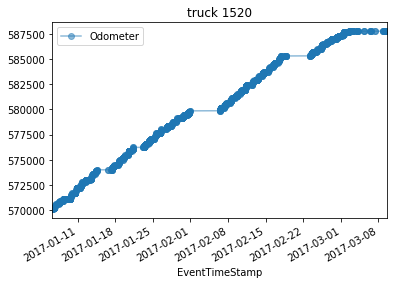

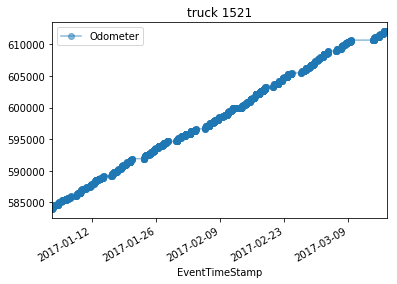

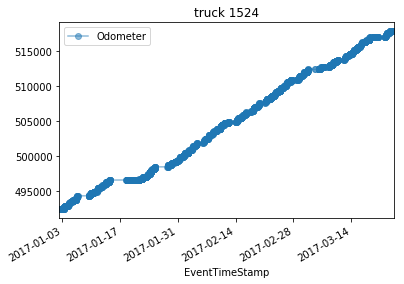

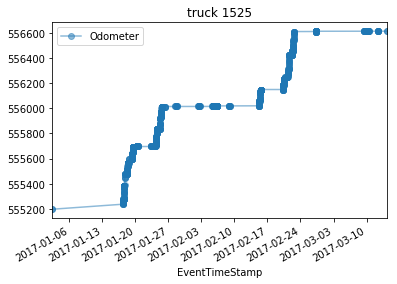

...

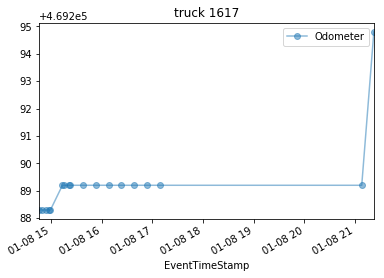

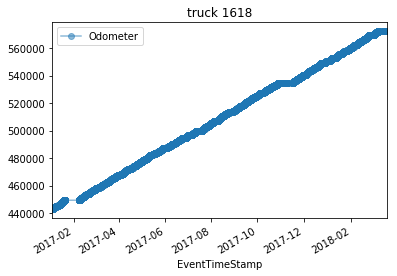

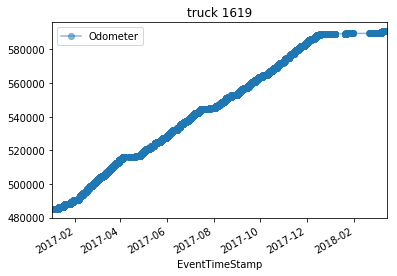

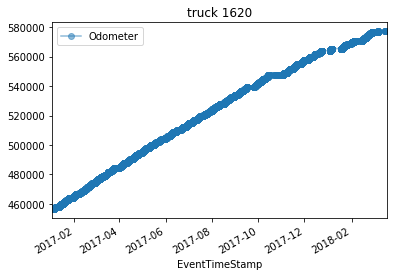

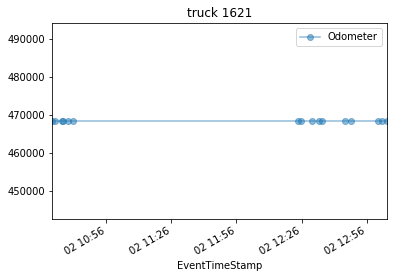

/Users/paulomartinez/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_base.py:2917: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=736726.494867, right=736726.494867
  'left=%s, right=%s') % (left, right))


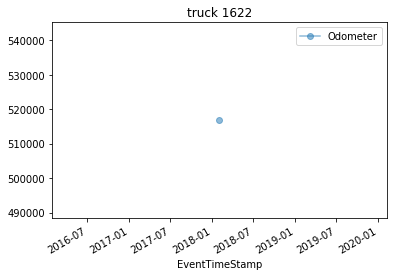

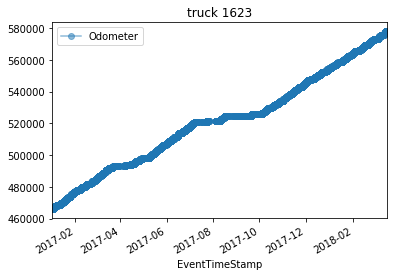

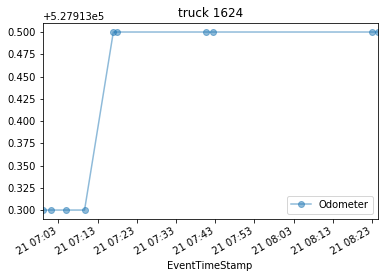

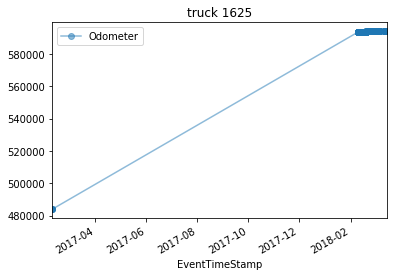

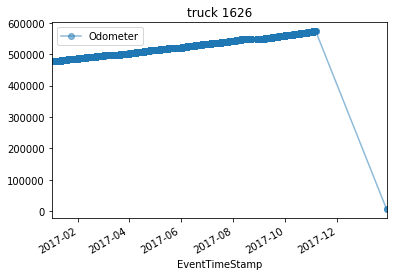

...

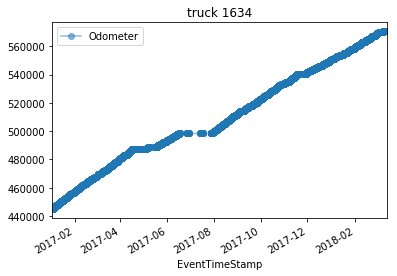

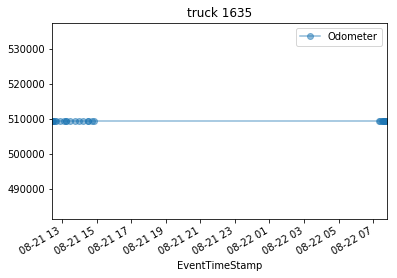

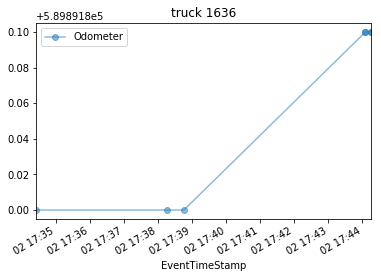

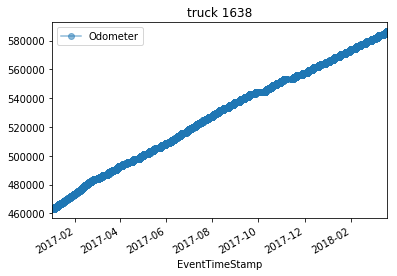

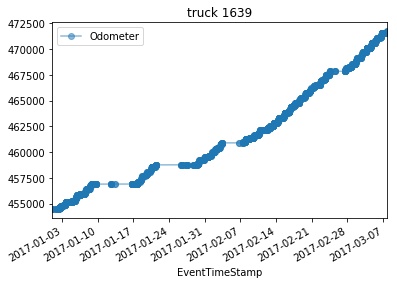

In [25]:
#this cell will generate odometer plot series. One for every truck.

for truck in toydf[toyseries].truck.unique():
    _ = toydf[toyseries][toydf.truck == truck].plot(x = 'EventTimeStamp', y = 'Odometer', marker = 'o', alpha = 0.5, 
                                                               title = 'truck ' + str(truck))
    plt.show()

# troublesome_odometers = [2099, 1554, 1558, 1565, 1572, 1579, 1580, 1582, 1597, 1598, 1599, 1626, 1668, 1682, 1771, 1782, 1789, 1849, 1859, 1894, 1899, 1917, 1919, 1924, 1933, 1940, 2011]

In [27]:
tr1555_events_levels_df = events_levels_df[events_levels_df.truck == 1554]

In [28]:
tr1555_events_levels_df

,Id,EventTimeStamp,EquipmentID,DriverID,Latitude,Longitude,LocationTimeStamp,Speed,Odometer,IgnitionStatus,EFReportReason,TankLevelPercent,TankLevelGallons,ExactFuelEventId,truck,tankcap
204992,12668252,2017-01-03 06:19:27.497,1554,HILF,38.35994,-81.73622,2017-01-03 06:19:30,0,524947.2,2,1,72.099998,180.25,12668252,1554,250
204993,12668282,2017-01-03 06:21:27.527,1554,HILF,38.35994,-81.73622,2017-01-03 06:21:30,0,524947.2,2,0,72.099998,180.25,12668282,1554,250
204994,12668386,2017-01-03 06:30:27.527,1554,HILF,38.35998,-81.73621,2017-01-03 06:30:30,0,524947.2,1,0,71.900002,179.75,12668386,1554,250
204995,12668628,2017-01-03 06:45:37.527,1554,HILF,38.35998,-81.73621,2017-01-03 06:45:40,0,524947.2,1,2,72.000000,180.00,12668628,1554,250
204996,12668832,2017-01-03 06:58:37.527,1554,HILF,38.35997,-81.73623,2017-01-03 06:58:40,0,524947.2,2,1,72.000000,180.00,12668832,1554,250
204997,12670314,2017-01-03 08:08:27.777,1554,HILF,38.36001,-81.73622,2017-01-03 08:08:30,0,524947.2,1,1,72.000000,180.00,12670314,1554,250
204998,12670363,2017-01-03 08:10:27.777,1554,HILF,38.36000,-81.73619,2017-01-03 08:10:30,0,524947.2,1,0,72.000000,180.00,12670363,1554,250
204999,12670695,2017-01-03 08:25:27.870,1554,HILF,38.42762,-81.81776,2017-01-03 08:25:30,68,524954.0,1,2,71.300003,178.25,12670695,1554,250
205000,12671921,2017-01-03 09:25:28.293,1554,HILF,38.34814,-82.92271,2017-01-03 09:25:30,65,525017.6,1,2,64.400002,161.00,12671921,1554,250
205001,12672223,2017-01-03 09:40:28.310,1554,HILF,38.43984,-83.06577,2017-01-03 09:40:30,65,525028.7,1,2,64.800003,162.00,12672223,1554,250


In [29]:
tr1555_events_levels_df.reset_index(inplace = True, drop = True)
tr1555_events_levels_df

,Id,EventTimeStamp,EquipmentID,DriverID,Latitude,Longitude,LocationTimeStamp,Speed,Odometer,IgnitionStatus,EFReportReason,TankLevelPercent,TankLevelGallons,ExactFuelEventId,truck,tankcap
0,12668252,2017-01-03 06:19:27.497,1554,HILF,38.35994,-81.73622,2017-01-03 06:19:30,0,524947.2,2,1,72.099998,180.25,12668252,1554,250
1,12668282,2017-01-03 06:21:27.527,1554,HILF,38.35994,-81.73622,2017-01-03 06:21:30,0,524947.2,2,0,72.099998,180.25,12668282,1554,250
2,12668386,2017-01-03 06:30:27.527,1554,HILF,38.35998,-81.73621,2017-01-03 06:30:30,0,524947.2,1,0,71.900002,179.75,12668386,1554,250
3,12668628,2017-01-03 06:45:37.527,1554,HILF,38.35998,-81.73621,2017-01-03 06:45:40,0,524947.2,1,2,72.000000,180.00,12668628,1554,250
4,12668832,2017-01-03 06:58:37.527,1554,HILF,38.35997,-81.73623,2017-01-03 06:58:40,0,524947.2,2,1,72.000000,180.00,12668832,1554,250
5,12670314,2017-01-03 08:08:27.777,1554,HILF,38.36001,-81.73622,2017-01-03 08:08:30,0,524947.2,1,1,72.000000,180.00,12670314,1554,250
6,12670363,2017-01-03 08:10:27.777,1554,HILF,38.36000,-81.73619,2017-01-03 08:10:30,0,524947.2,1,0,72.000000,180.00,12670363,1554,250
7,12670695,2017-01-03 08:25:27.870,1554,HILF,38.42762,-81.81776,2017-01-03 08:25:30,68,524954.0,1,2,71.300003,178.25,12670695,1554,250
8,12671921,2017-01-03 09:25:28.293,1554,HILF,38.34814,-82.92271,2017-01-03 09:25:30,65,525017.6,1,2,64.400002,161.00,12671921,1554,250
9,12672223,2017-01-03 09:40:28.310,1554,HILF,38.43984,-83.06577,2017-01-03 09:40:30,65,525028.7,1,2,64.800003,162.00,12672223,1554,250


In [30]:
flags155 = flag_anomal_odom_rows_2(tr1555_events_levels_df)

In [48]:
len(flags155) - sum(flags155)

530

In [42]:
flags155[-120:-1]

[False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False]

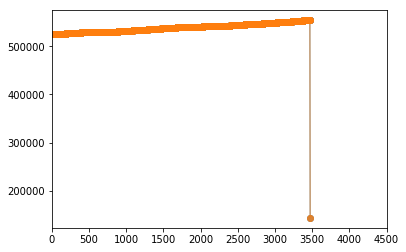

In [39]:
tr1555_events_levels_df[flags155].Odometer.plot(x = 'EventTimeStamp', y = 'Odometer', 
                                                marker = 'o', alpha = 0.5)
plt.xticks(np.arange(0,5000, 500))
plt.show()

In [53]:
indexes = np.random()

events_levels_df

,Id,EventTimeStamp,EquipmentID,DriverID,Latitude,Longitude,LocationTimeStamp,Speed,Odometer,IgnitionStatus,EFReportReason,TankLevelPercent,TankLevelGallons,ExactFuelEventId,truck,tankcap
0,20141602,2018-01-31 15:31:18.940,301,DELST,36.06673,-86.43488,2018-01-31 15:31:21,0,342355.5,2,1,71.400002,142.800003,20141602,301,200
1,20160137,2018-02-01 11:52:11.140,301,DELST,36.37535,-86.42045,2018-02-01 11:52:10,0,342355.5,2,1,61.200001,122.400002,20160137,301,200
2,20160134,2018-02-01 11:53:41.140,301,DELST,36.37535,-86.42045,2018-02-01 11:53:40,0,342355.5,2,0,61.200001,122.400002,20160134,301,200
3,20160136,2018-02-01 11:56:51.140,301,DELST,36.37535,-86.42045,2018-02-01 11:56:50,0,342521.1,2,1,61.299999,122.599998,20160136,301,200
4,20160188,2018-02-01 11:58:41.157,301,DELST,36.37535,-86.42045,2018-02-01 11:58:40,0,342521.1,2,0,61.299999,122.599998,20160188,301,200
5,20160663,2018-02-01 12:16:47.933,301,DELST,36.37533,-86.42041,2018-02-01 12:16:50,0,342521.1,1,0,62.500000,125.000000,20160663,301,200
6,20161001,2018-02-01 12:31:48.060,301,DELST,36.34041,-86.43724,2018-02-01 12:31:50,54,342524.4,1,2,59.700001,119.400002,20161001,301,200
7,20161357,2018-02-01 12:46:58.060,301,DELST,36.18599,-86.40793,2018-02-01 12:47:00,0,342535.3,1,2,52.299999,104.599998,20161357,301,200
8,20161731,2018-02-01 13:01:58.060,301,DELST,35.98844,-86.43675,2018-02-01 13:02:00,67,342549.5,1,2,49.400002,98.800003,20161731,301,200
9,20162643,2018-02-01 13:40:18.433,301,DELST,35.74282,-86.94077,2018-02-01 13:40:21,4,342590.2,1,2,47.099998,94.199997,20162643,301,200


In [57]:
events_levels_df[204990:204996]

,Id,EventTimeStamp,EquipmentID,DriverID,Latitude,Longitude,LocationTimeStamp,Speed,Odometer,IgnitionStatus,EFReportReason,TankLevelPercent,TankLevelGallons,ExactFuelEventId,truck,tankcap
204990,17419541,2017-09-07 06:04:57.497,1552,NaN,35.58829,-86.44382,2017-09-07 06:04:59,0,567565.9,2,1,40.500000,101.25,17419541,1552,250
204991,17419567,2017-09-07 06:06:27.497,1552,NaN,35.58829,-86.44382,2017-09-07 06:04:59,0,567565.9,2,0,40.500000,101.25,17419567,1552,250
204992,12668252,2017-01-03 06:19:27.497,1554,HILF,38.35994,-81.73622,2017-01-03 06:19:30,0,524947.2,2,1,72.099998,180.25,12668252,1554,250
204993,12668282,2017-01-03 06:21:27.527,1554,HILF,38.35994,-81.73622,2017-01-03 06:21:30,0,524947.2,2,0,72.099998,180.25,12668282,1554,250
204994,12668386,2017-01-03 06:30:27.527,1554,HILF,38.35998,-81.73621,2017-01-03 06:30:30,0,524947.2,1,0,71.900002,179.75,12668386,1554,250
204995,12668628,2017-01-03 06:45:37.527,1554,HILF,38.35998,-81.73621,2017-01-03 06:45:40,0,524947.2,1,2,72.000000,180.00,12668628,1554,250


In [61]:
foo = events_levels_df[204990:204996]
foo.reset_index(inplace = True, drop = True)
foo

,Id,EventTimeStamp,EquipmentID,DriverID,Latitude,Longitude,LocationTimeStamp,Speed,Odometer,IgnitionStatus,EFReportReason,TankLevelPercent,TankLevelGallons,ExactFuelEventId,truck,tankcap
0,17419541,2017-09-07 06:04:57.497,1552,NaN,35.58829,-86.44382,2017-09-07 06:04:59,0,567565.9,2,1,40.500000,101.25,17419541,1552,250
1,17419567,2017-09-07 06:06:27.497,1552,NaN,35.58829,-86.44382,2017-09-07 06:04:59,0,567565.9,2,0,40.500000,101.25,17419567,1552,250
2,12668252,2017-01-03 06:19:27.497,1554,HILF,38.35994,-81.73622,2017-01-03 06:19:30,0,524947.2,2,1,72.099998,180.25,12668252,1554,250
3,12668282,2017-01-03 06:21:27.527,1554,HILF,38.35994,-81.73622,2017-01-03 06:21:30,0,524947.2,2,0,72.099998,180.25,12668282,1554,250
4,12668386,2017-01-03 06:30:27.527,1554,HILF,38.35998,-81.73621,2017-01-03 06:30:30,0,524947.2,1,0,71.900002,179.75,12668386,1554,250
5,12668628,2017-01-03 06:45:37.527,1554,HILF,38.35998,-81.73621,2017-01-03 06:45:40,0,524947.2,1,2,72.000000,180.00,12668628,1554,250


In [64]:
foo.Odometer[3] = 100
foo.Odometer[4] = 101
#foo.Odometer[5] = 
foo

/Users/paulomartinez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/Users/paulomartinez/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2862: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  exec(code_obj, self.user_global_ns, self.user_ns)
/Users/paulomartinez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-ve

,Id,EventTimeStamp,EquipmentID,DriverID,Latitude,Longitude,LocationTimeStamp,Speed,Odometer,IgnitionStatus,EFReportReason,TankLevelPercent,TankLevelGallons,ExactFuelEventId,truck,tankcap
0,17419541,2017-09-07 06:04:57.497,1552,NaN,35.58829,-86.44382,2017-09-07 06:04:59,0,567565.9,2,1,40.500000,101.25,17419541,1552,250
1,17419567,2017-09-07 06:06:27.497,1552,NaN,35.58829,-86.44382,2017-09-07 06:04:59,0,567565.9,2,0,40.500000,101.25,17419567,1552,250
2,12668252,2017-01-03 06:19:27.497,1554,HILF,38.35994,-81.73622,2017-01-03 06:19:30,0,524947.2,2,1,72.099998,180.25,12668252,1554,250
3,12668282,2017-01-03 06:21:27.527,1554,HILF,38.35994,-81.73622,2017-01-03 06:21:30,0,100.0,2,0,72.099998,180.25,12668282,1554,250
4,12668386,2017-01-03 06:30:27.527,1554,HILF,38.35998,-81.73621,2017-01-03 06:30:30,0,101.0,1,0,71.900002,179.75,12668386,1554,250
5,12668628,2017-01-03 06:45:37.527,1554,HILF,38.35998,-81.73621,2017-01-03 06:45:40,0,524947.2,1,2,72.000000,180.00,12668628,1554,250


In [65]:
_ = flag_anomal_odom_rows_2(foo)

In [66]:
_

[True, True, True, False, False, True]